### Imports

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
#import seaborn as sns
from datetime import datetime

import matplotlib.dates as mdates
from matplotlib.dates import DateFormatter

In [2]:
df = pd.read_csv('../../02_Daten/Validierung/4.csv', sep=',')

C:\Users\pauls\AppData\Roaming\Python\Python38\site-packages\IPython\core\interactiveshell.py:3444: DtypeWarning: Columns (1,11,12,13,14) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


### Datensätze kennenlernen

In [3]:
# Richtige Zeit für alle Einträge
df['date'] = [datetime.utcfromtimestamp(x/1000) for x in df['timestamp']]

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1969156 entries, 0 to 1969155
Data columns (total 22 columns):
 #   Column                              Dtype         
---  ------                              -----         
 0   timestamp                           int64         
 1   identnummer                         object        
 2   assemblyGroup                       float64       
 3   iomaster                            bool          
 4   messenaktiv                         bool          
 5   handaktiv                           bool          
 6   druck                               float64       
 7   temperatur                          float64       
 8   leck                                float64       
 9   liveleck                            float64       
 10  status                              int64         
 11  maintenance_label                   object        
 12  rework_label                        object        
 13  configuration_label                 object

In [5]:
df.isnull().sum()

timestamp                                   0
identnummer                            706609
assemblyGroup                          706609
iomaster                                    0
messenaktiv                                 0
handaktiv                                   0
druck                                       0
temperatur                                  0
leck                                        0
liveleck                                    0
status                                      0
maintenance_label                     1967053
rework_label                          1937202
configuration_label                   1968108
repair_label                          1968556
maintenance_label_cleaning                  0
rework_label_assembly_error                 0
repair_label_change_dichtring               0
configuration_label_druck_change_5          0
configuration_label_druck_change_6          0
configuration_label_druck_change_7          0
date                              

In [6]:
df.dropna(axis=1, inplace=True)

In [7]:
df.liveleck.value_counts()

 0.000000      850942
-100.000000    274137
-4.812506          23
-4.324788          23
-4.789605          23
                ...  
-88.204401          1
-92.136267          1
-96.068134          1
-12.076870          1
-23.706764          1
Name: liveleck, Length: 494001, dtype: int64

### Messwerte über Zeitraum plotten

df4

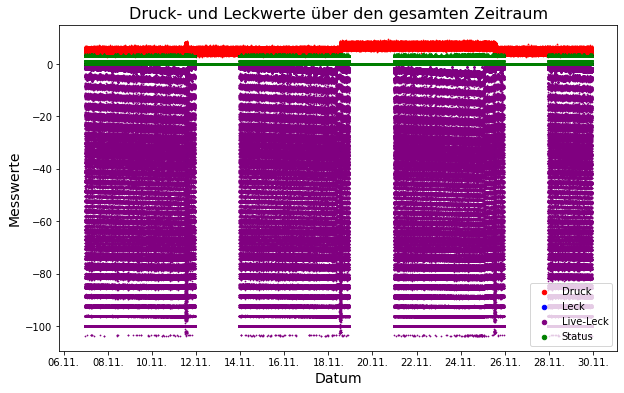

In [8]:
fig, ax = plt.subplots(figsize=(10,6))
ax.scatter(df.date, df.druck, color='red', label='Druck', s=0.5)
ax.scatter(df.date, df.leck, color='blue', label='Leck', s=0.5)
ax.scatter(df.date, df.liveleck, color='purple', label='Live-Leck', s=0.5)
ax.scatter(df.date, df.status, color='green', label='Status', s=0.5)

date_form = DateFormatter("%d.%m.")
ax.xaxis.set_major_locator(mdates.DayLocator(interval=2)) # damit nicht direkt nach dem 31.10 der 01.11 angezeigt wird
ax.xaxis.set_major_formatter(date_form)

ax.set_title("Druck- und Leckwerte über den gesamten Zeitraum", fontsize=16)
ax.set_xlabel("Datum", fontsize=14)
ax.set_ylabel("Messwerte", fontsize=14)

lgnd = plt.legend(loc=4, numpoints=1, fontsize=10)

#change the marker size manually for lines
lgnd.legendHandles[0]._sizes = [20]
lgnd.legendHandles[1]._sizes = [20]
lgnd.legendHandles[2]._sizes = [20]
lgnd.legendHandles[3]._sizes = [20]

Prozess eines Messvorgangs genauer anschauen

In [9]:
df[df.liveleck!=0]

,timestamp,iomaster,messenaktiv,handaktiv,druck,temperatur,leck,liveleck,status,maintenance_label_cleaning,rework_label_assembly_error,repair_label_change_dichtring,configuration_label_druck_change_5,configuration_label_druck_change_6,configuration_label_druck_change_7,date
211,1667775812000,False,True,False,4.725240,24.004845,0.0,-100.000000,3,False,False,False,False,False,False,2022-11-06 23:03:32
212,1667775813000,False,True,False,5.493854,24.004845,0.0,-100.000000,3,False,False,False,False,False,False,2022-11-06 23:03:33
213,1667775814000,False,True,False,5.102452,24.004845,0.0,-100.000000,3,False,False,False,False,False,False,2022-11-06 23:03:34
214,1667775815000,False,True,False,5.336762,24.004845,0.0,-100.000000,3,False,False,False,False,False,False,2022-11-06 23:03:35
215,1667775816000,False,True,False,4.779593,24.004845,0.0,-100.000000,3,False,False,False,False,False,False,2022-11-06 23:03:36
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1969151,1669762796000,False,True,False,5.668804,24.017771,0.0,-5.199465,3,False,False,False,False,False,False,2022-11-29 22:59:56
1969152,1669762797000,False,True,False,4.435486,24.017771,0.0,-1.553291,3,False,False,False,False,False,False,2022-11-29 22:59:57
1969153,1669762798000,False,True,False,4.614135,24.017771,0.0,-1.553291,3,False,False,False,False,False,False,2022-11-29 22:59:58
1969154,1669762799000,False,True,False,4.480499,24.017771,0.0,-1.553291,3,False,False,False,False,False,False,2022-11-29 22:59:59


In [10]:
df[250:300]

,timestamp,iomaster,messenaktiv,handaktiv,druck,temperatur,leck,liveleck,status,maintenance_label_cleaning,rework_label_assembly_error,repair_label_change_dichtring,configuration_label_druck_change_5,configuration_label_druck_change_6,configuration_label_druck_change_7,date
250,1667775851000,False,True,False,4.891106,24.004845,0.000000,-12.243423,3,False,False,False,False,False,False,2022-11-06 23:04:11
251,1667775852000,False,True,False,5.026464,24.004845,0.000000,-8.586899,3,False,False,False,False,False,False,2022-11-06 23:04:12
252,1667775853000,False,True,False,5.476722,24.004845,0.000000,-4.930375,3,False,False,False,False,False,False,2022-11-06 23:04:13
253,1667775854000,False,True,False,4.020309,24.004845,0.000000,-1.273851,3,False,False,False,False,False,False,2022-11-06 23:04:14
254,1667775855000,False,True,False,4.808359,24.004845,0.000000,-1.273851,3,False,False,False,False,False,False,2022-11-06 23:04:15
255,1667775856000,False,True,False,4.696572,24.004845,0.000000,-1.273851,3,False,False,False,False,False,False,2022-11-06 23:04:16
256,1667775857000,False,True,False,5.070183,24.004845,0.000000,-1.273851,3,False,False,False,False,False,False,2022-11-06 23:04:17
257,1667775858000,False,True,False,5.136736,24.004845,0.000000,-1.273851,3,False,False,False,False,False,False,2022-11-06 23:04:18
258,1667775859000,False,True,False,4.630565,24.004845,0.000000,-1.273851,3,False,False,False,False,False,False,2022-11-06 23:04:19
259,1667775860000,False,True,False,5.548979,24.004845,0.000000,-1.273851,3,False,False,False,False,False,False,2022-11-06 23:04:20


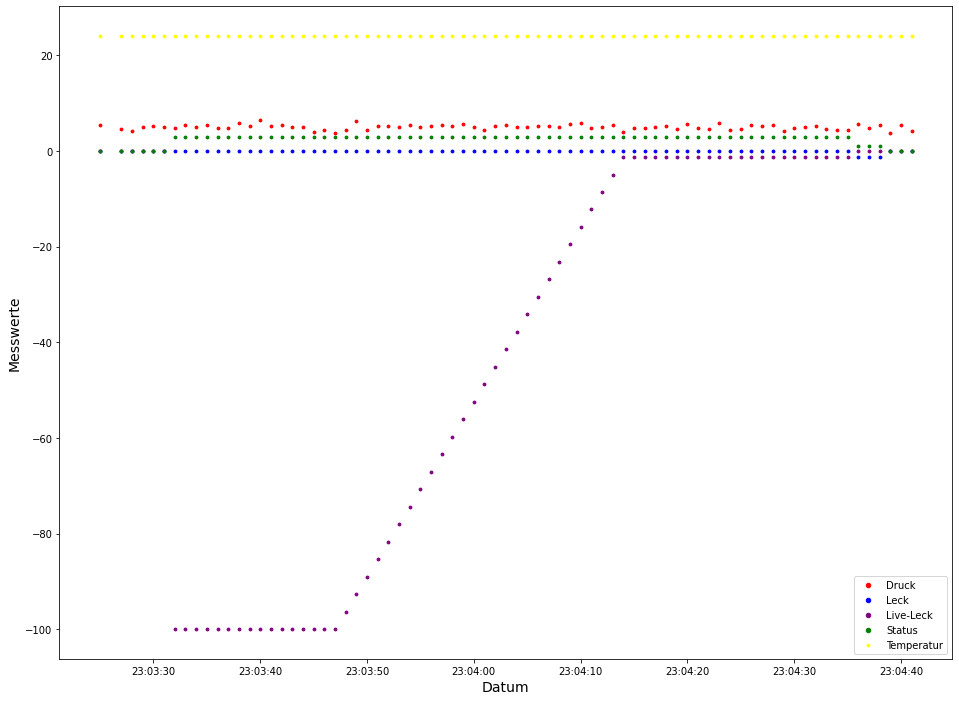

In [21]:
sample = df[205:281]
fig, ax = plt.subplots(figsize=(16,12))
ax.scatter(sample.date, sample.druck, color='red', label='Druck', s=8)
ax.scatter(sample.date, sample.leck, color='blue', label='Leck', s=8)
ax.scatter(sample.date, sample.liveleck, color='purple', label='Live-Leck', s=8)
ax.scatter(sample.date, sample.status, color='green', label='Status', s=8)
ax.scatter(sample.date, sample.temperatur, color='yellow', label='Temperatur', s=8)

ax.set_xlabel("Datum", fontsize=14)
ax.set_ylabel("Messwerte", fontsize=14)

lgnd = plt.legend(loc=4, numpoints=1, fontsize=10)

#change the marker size manually for lines
lgnd.legendHandles[0]._sizes = [20]
lgnd.legendHandles[1]._sizes = [20]
lgnd.legendHandles[2]._sizes = [20]
lgnd.legendHandles[3]._sizes = [20]

### Anomalie Vorverarbeitung

interessante Spalten nehmen

In [4]:
df_col = df[['iomaster','druck','temperatur','leck', 'liveleck', 'status','date']]

In [14]:
df_col

,iomaster,druck,temperatur,leck,liveleck,status,date
0,False,5.419293,23.925303,0.0,0.000000,0,2022-11-06 23:00:00
1,False,4.437359,24.078188,0.0,0.000000,0,2022-11-06 23:00:01
2,False,4.854461,23.977208,0.0,0.000000,0,2022-11-06 23:00:02
3,False,5.028491,23.983130,0.0,0.000000,0,2022-11-06 23:00:03
4,False,4.439437,23.937964,0.0,0.000000,0,2022-11-06 23:00:04
...,...,...,...,...,...,...,...
1969151,False,5.668804,24.017771,0.0,-5.199465,3,2022-11-29 22:59:56
1969152,False,4.435486,24.017771,0.0,-1.553291,3,2022-11-29 22:59:57
1969153,False,4.614135,24.017771,0.0,-1.553291,3,2022-11-29 22:59:58
1969154,False,4.480499,24.017771,0.0,-1.553291,3,2022-11-29 22:59:59


Time Series schneiden

In [5]:
time_series = []
# wenn es eine Änderung des Status gibt, wird der Index an dieser Stelle abgespeichert
ind_changes = df_col[df_col["status"].shift() != df_col["status"]].index.tolist() 
# dann für jede Änderung abschneiden und DF_col der Liste hinzufügen
for index, elem in enumerate(ind_changes):
    # nur ts erstellen, wenn der erste Status 3 ist, da dann Bauteil in Maschine
    if df_col.status[elem] == 3:
        if index + 1 < len(ind_changes):
            # mit dem zweiten +1 wird der Wert des Index erhöht, damit der letzte Eintrag den resultierenden Status der Prüfung enthält
            next_el = ind_changes[index+1]+1  
            ts = df_col[elem:next_el].reset_index(drop=True)
        else:
            ts = df_col[elem:].reset_index(drop=True)
            
        time_series.append(ts)

In [16]:
time_series

[    iomaster     druck  temperatur      leck    liveleck  status  \
 0      False  4.725240   24.004845  0.000000 -100.000000       3   
 1      False  5.493854   24.004845  0.000000 -100.000000       3   
 2      False  5.102452   24.004845  0.000000 -100.000000       3   
 3      False  5.336762   24.004845  0.000000 -100.000000       3   
 4      False  4.779593   24.004845  0.000000 -100.000000       3   
 ..       ...       ...         ...       ...         ...     ...   
 60     False  5.214779   24.004845  0.000000   -1.273851       3   
 61     False  4.645834   24.004845  0.000000   -1.273851       3   
 62     False  4.304204   24.004845  0.000000   -1.273851       3   
 63     False  4.326538   24.004845  0.000000   -1.273851       3   
 64     False  5.729084   24.004845 -1.273851    0.000000       1   
 
                   date  
 0  2022-11-06 23:03:32  
 1  2022-11-06 23:03:33  
 2  2022-11-06 23:03:34  
 3  2022-11-06 23:03:35  
 4  2022-11-06 23:03:36  
 ..           

In [17]:
df.status.value_counts()

3    1118214
0     796219
1      53271
4       1452
Name: status, dtype: int64

nach status aufteilen, um beide Fälle getrennt betrachen und Anomalien erkennen zu können

In [75]:
status_4 = []
status_1 = []
for t in time_series:
    if t.status[len(t)-1] == 4:
        #status_4.append(t[:-1])
        status_4.append(t[:60]) # Daten müssen für to_time_series alle die gleiche Länge haben (60 ist die kleinste Länge mancher TS)
    else:
        #status_1.append(t[:-1])
        status_1.append(t[:60])

In [54]:
status_4

[    iomaster     druck  temperatur  leck    liveleck  status  \
 0      False  5.475996   23.954289   0.0 -100.000000       3   
 1      False  4.801566   23.954289   0.0 -100.000000       3   
 2      False  4.893879   23.954289   0.0 -100.000000       3   
 3      False  4.609000   23.954289   0.0 -100.000000       3   
 4      False  4.781712   23.954289   0.0 -100.000000       3   
 5      False  4.973977   23.954289   0.0 -100.000000       3   
 6      False  4.944375   23.954289   0.0 -100.000000       3   
 7      False  4.605438   23.954289   0.0 -100.000000       3   
 8      False  4.431609   23.954289   0.0 -100.000000       3   
 9      False  5.399212   23.954289   0.0 -100.000000       3   
 10     False  5.331750   23.954289   0.0 -100.000000       3   
 11     False  5.621697   23.954289   0.0 -100.000000       3   
 12     False  5.838810   23.954289   0.0 -100.000000       3   
 13     False  4.827931   23.954289   0.0 -100.000000       3   
 14     False  6.215536  

In [57]:
status_1

[    iomaster     druck  temperatur  leck    liveleck  status  \
 0      False  4.725240   24.004845   0.0 -100.000000       3   
 1      False  5.493854   24.004845   0.0 -100.000000       3   
 2      False  5.102452   24.004845   0.0 -100.000000       3   
 3      False  5.336762   24.004845   0.0 -100.000000       3   
 4      False  4.779593   24.004845   0.0 -100.000000       3   
 5      False  4.833281   24.004845   0.0 -100.000000       3   
 6      False  5.888715   24.004845   0.0 -100.000000       3   
 7      False  5.277971   24.004845   0.0 -100.000000       3   
 8      False  6.562728   24.004845   0.0 -100.000000       3   
 9      False  5.229542   24.004845   0.0 -100.000000       3   
 10     False  5.504288   24.004845   0.0 -100.000000       3   
 11     False  5.006733   24.004845   0.0 -100.000000       3   
 12     False  5.094057   24.004845   0.0 -100.000000       3   
 13     False  4.014743   24.004845   0.0 -100.000000       3   
 14     False  4.393144  

alle TS plotten

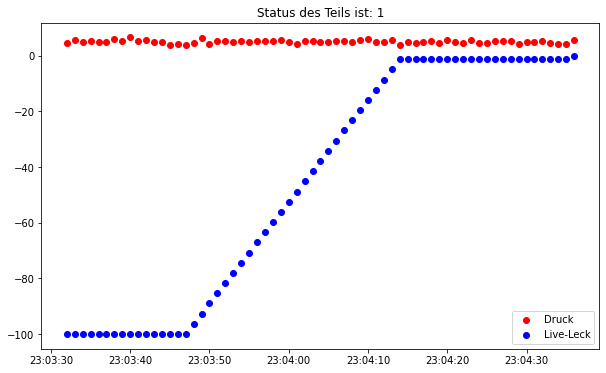

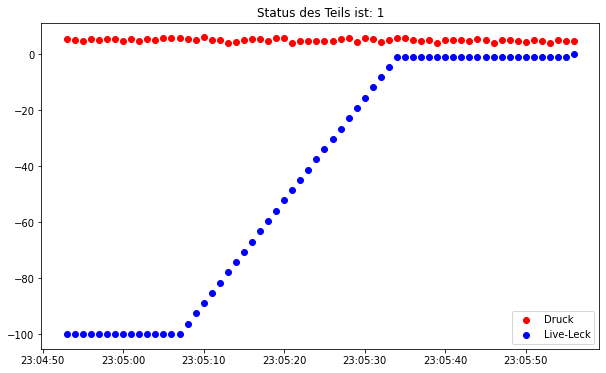

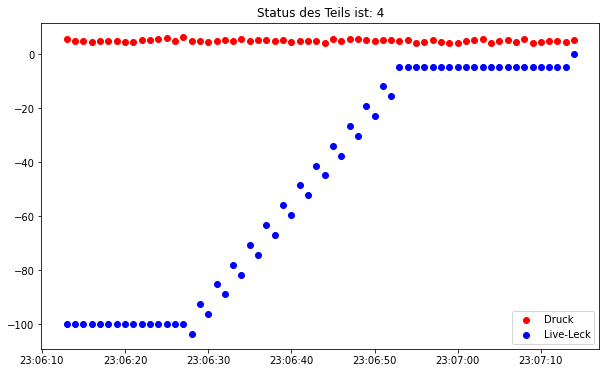

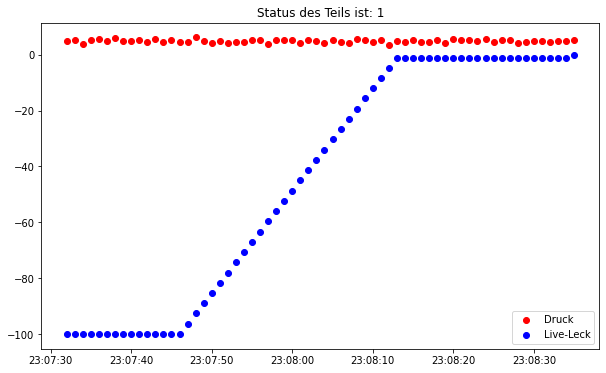

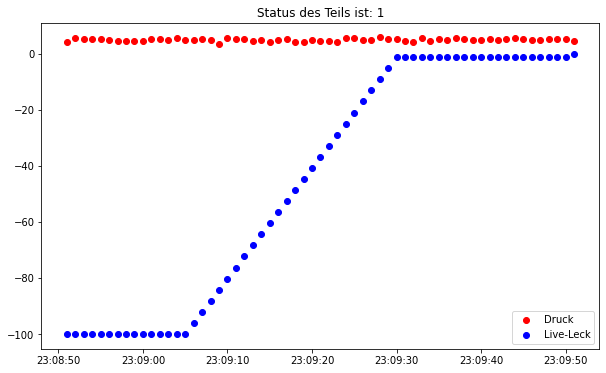

...

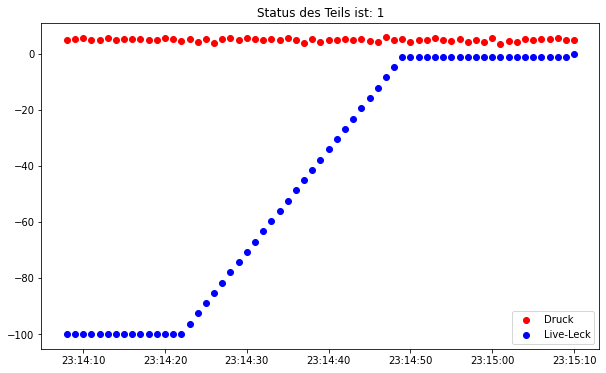

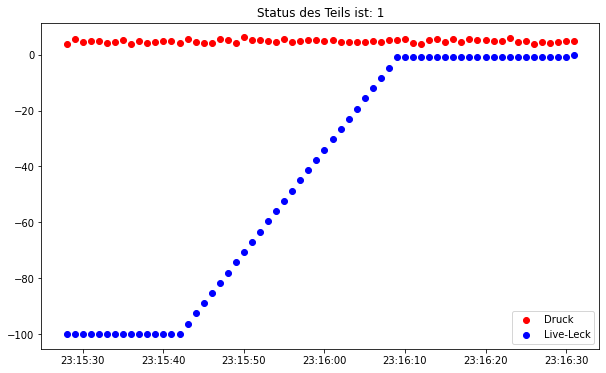

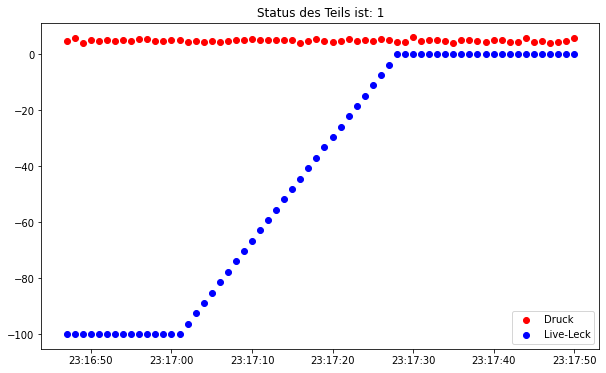

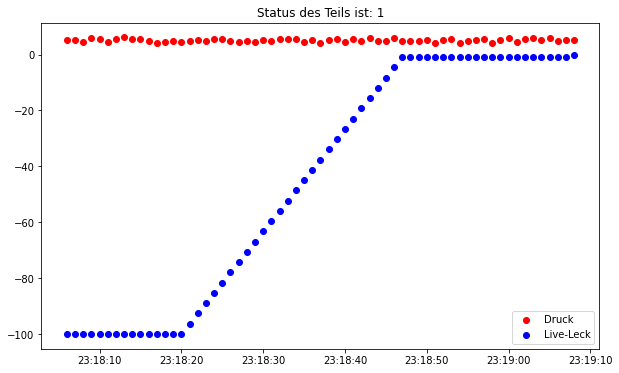

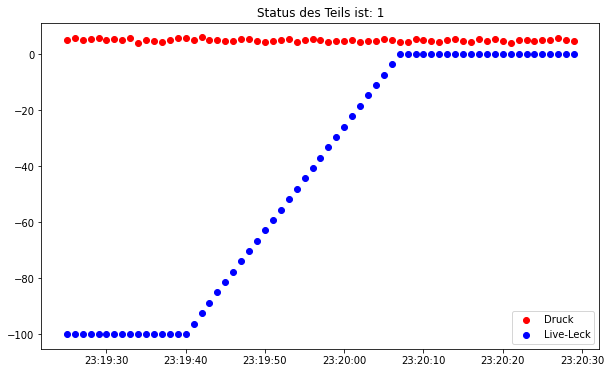

KeyboardInterrupt: 

In [20]:
'''
for t in time_series:
    #if t.status[len(t)-1] == 4:
        fig, ax = plt.subplots(figsize=(10,6))
        ax.scatter(t.date, t.druck, color='red', label='Druck')
        ax.scatter(t.date, t.liveleck, color='blue', label='Live-Leck')
        ax.set_title(f"Status des Teils ist: {t.status[len(t)-1]}")
        plt.legend()
        plt.show()
        fig.clear()
'''

#### Status 4

alle Werte nochmal in Liste, da so das Format für to_time_series

In [76]:
leck_liste_s4 = []
for t in status_4:
    leck_liste_s4.append(list(t.liveleck))

In [77]:
from tslearn.utils import to_time_series
from tslearn.utils import to_time_series_dataset #für variable Länge sollte eig klappen: https://tslearn.readthedocs.io/en/stable/variablelength.html 
formatted_time_series = to_time_series([[status_4[0].liveleck], [status_4[1].liveleck], [status_4[2].liveleck]])
print(formatted_time_series.shape)

(3, 1, 60)


In [79]:
from tslearn.utils import to_time_series
formatted_ts_s4 = to_time_series(leck_liste_s4)
print(formatted_ts_s4.shape)

(484, 60)


#### Status 1

alle Werte nochmal in Liste, da so das Format für to_time_series

In [80]:
status_1 = status_1[:-1]

In [81]:
leck_liste_s1 = []
for t in status_1:
    leck_liste_s1.append(list(t.liveleck))

In [82]:
from tslearn.utils import to_time_series
formatted_ts_s1 = to_time_series(leck_liste_s1)
print(formatted_ts_s1.shape)

(17557, 60)


### KMeans Clustering

#### für Status 4

In [71]:
from tslearn.clustering import TimeSeriesKMeans

In [86]:
Sum_of_squared_distances = []
K = range(2,7)
for k in K:
    km = TimeSeriesKMeans(n_clusters=k)
    km = km.fit(formatted_ts_s4)
    Sum_of_squared_distances.append(km.inertia_)

k = 3 am besten

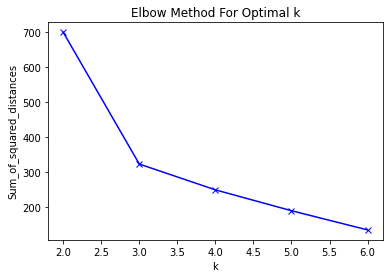

In [88]:
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [94]:
km = TimeSeriesKMeans(n_clusters=3, verbose=True, random_state=42)
y_pred = km.fit_predict(formatted_ts_s4)

437.621 --> 337.376 --> 328.466 --> 323.392 --> 322.705 --> 322.705 --> 


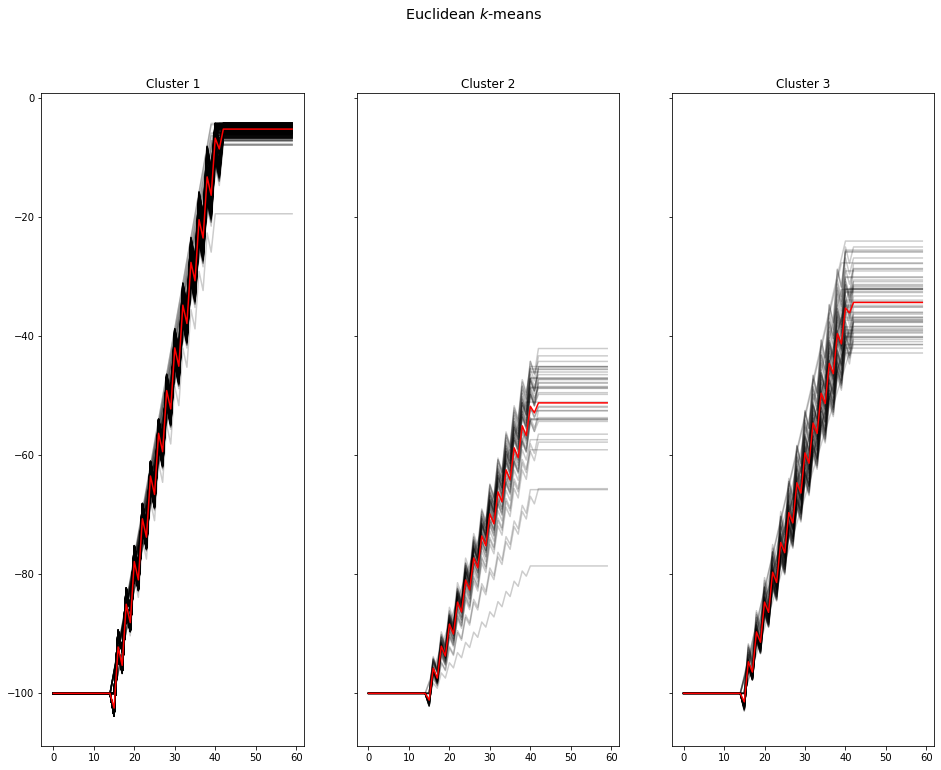

In [97]:
fig, ax = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(16,12))
fig.suptitle("Euclidean $k$-means", fontsize='x-large')
for yi in range(3):
    # each axes in the top row gets its own axes title
    ax[yi].set_title('Cluster {}'.format(yi+1))
    for xx in formatted_ts_s4[y_pred == yi]: # pro Cluster die ganzen TS plotten
        ax[yi].plot(xx.ravel(), "k-", alpha=.2)
    ax[yi].plot(km.cluster_centers_[yi].ravel(), "r-") # pro Cluster einmal das Zentrum plotten (red)

für Status 1

In [100]:
Sum_of_squared_distances = []
K = range(2,7)
for k in K:
    km = TimeSeriesKMeans(n_clusters=k)
    km = km.fit(formatted_ts_s1)
    Sum_of_squared_distances.append(km.inertia_)

k = 3 am besten

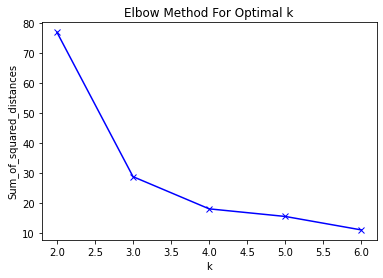

In [101]:
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [102]:
km = TimeSeriesKMeans(n_clusters=3, verbose=True, random_state=42)
y_pred = km.fit_predict(formatted_ts_s1)

39.217 --> 28.972 --> 28.758 --> 28.710 --> 28.698 --> 28.694 --> 28.692 --> 28.692 --> 28.692 --> 28.692 --> 28.692 --> 28.692 --> 


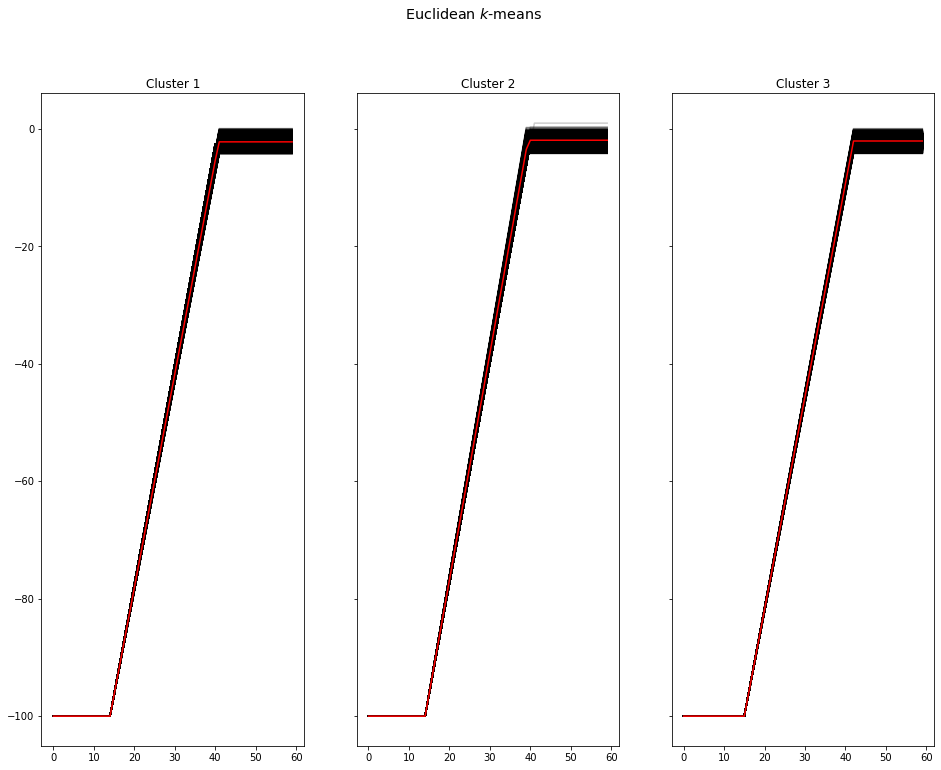

In [103]:
fig, ax = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(16,12))
fig.suptitle("Euclidean $k$-means", fontsize='x-large')
for yi in range(3):
    # each axes in the top row gets its own axes title
    ax[yi].set_title('Cluster {}'.format(yi+1))
    for xx in formatted_ts_s1[y_pred == yi]: # pro Cluster die ganzen TS plotten
        ax[yi].plot(xx.ravel(), "k-", alpha=.2)
    ax[yi].plot(km.cluster_centers_[yi].ravel(), "r-") # pro Cluster einmal das Zentrum plotten (red)

In [38]:
from collections import Counter

In [39]:
Counter(y_pred)

Counter({1: 3723, 3: 8162, 0: 6058, 2: 98})

In [42]:
len(y_pred)

18041

#### Soft DTW kmeans

In [22]:
sdtw_km = TimeSeriesKMeans(n_clusters=4,
                           metric="softdtw",
                           metric_params={"gamma": .01},
                           verbose=True,
                           random_state=42)
y_pred_sdtw = sdtw_km.fit_predict(formatted_time_series)

KeyboardInterrupt: 

In [ ]:
plt.figure()
for yi in range(4):
    plt.subplot(1, 4, yi + 1)
    for xx in formatted_time_series[y_pred_sdtw == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(sdtw_km.cluster_centers_[yi].ravel(), "r-")
    plt.xlim(0, 60)
    plt.ylim(-105, 2)
    plt.text(0.55, 0.85,'Cluster %d' % (yi + 1),
             transform=plt.gca().transAxes)
    if yi == 1:
        plt.title("Soft DTW $k$-means")